encadrant : louis.bahrman@telecom-paris.fr

In [ ]:
from scipy import signal
import numpy as np
import matplotlib.pyplot as plt
import os, wave, struct
from google.colab import drive
from IPython.display import Audio

In [ ]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Two-channel filter bank

In [ ]:
def load_sound(file):
    return wave.open(file, 'rb')

In [ ]:
data_path = os.getcwd()
filename1 = '/content/drive/MyDrive/Colab Notebooks/dataset-tp2-tsia/homme3.wav'
sound = os.path.join(data_path, filename1) 

In [ ]:
wavefile = wave.open(sound, 'rb')
print(wavefile.getparams())

_wave_params(nchannels=1, sampwidth=2, framerate=22050, nframes=330750, comptype='NONE', compname='not compressed')


In [ ]:
Fs = int(wavefile.getframerate())
num_samples = int(wavefile.getnframes())
data = wavefile.readframes(num_samples)
data = struct.unpack('{n}h'.format(n=num_samples), data)
x = np.array(data)

In [ ]:
data_path = os.getcwd()
filename2 = '/content/drive/MyDrive/Colab Notebooks/dataset-tp2-tsia/femme3.wav'
sound = os.path.join(data_path, filename2) 
wavefile = wave.open(sound, 'rb')
print(wavefile.getparams())
Fs = int(wavefile.getframerate())
num_samples = int(wavefile.getnframes())
data = wavefile.readframes(num_samples)
data = struct.unpack('{n}h'.format(n=num_samples), data)
x2 = np.array(data)

_wave_params(nchannels=1, sampwidth=2, framerate=22050, nframes=330750, comptype='NONE', compname='not compressed')


## Synthesis of a half-band filter

## 1. Synthesize the half-band and low-pass filter g(n) by using the Rémez method.

In [ ]:
def plot_response(fs, w, h, title):
  "Utility function to plot response functions"
  fig = plt.figure()
  ax = fig.add_subplot(111)
  ax.plot(0.5*fs*w/np.pi, 20*np.log10(np.abs(h)))
  ax.set_ylim(-40, 5)
  ax.set_xlim(0, 0.5*fs)
  ax.grid(True)
  ax.set_xlabel('Frequency (Hz)')
  ax.set_ylabel('Gain (dB)')
  ax.set_title(title)

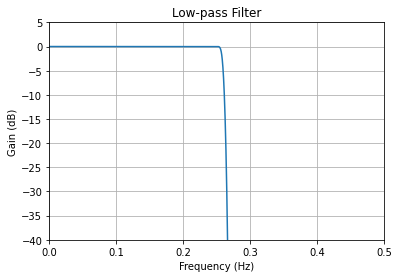

In [ ]:
fs = 1       # Sample rate, Hz
cutoff = 1/4  # Desired cutoff frequency, Hz
trans_width = 1/50  # Width of transition from pass band to stop band, Hz
numtaps = 401      # Size of the FIR filter.
h = signal.remez(numtaps, [0, cutoff, cutoff + trans_width, 0.5*fs], [1, 0], Hz=fs)
w, H = signal.freqz(h, [1], worN=2000)
plot_response(fs, w, H, "Low-pass Filter")

In [ ]:
np.sum(h[::2]) - np.max(h[::2])

-0.01999988288146337

In [ ]:
np.sum(h[1::2]) - np.max(h[1::2])

0.18236408961478928

This filter does not respect the half-band condition rigorously.

## 2. Manually zeroing the coefficients which should be zero

In [ ]:
tmp = h[len(h)//2]
h[::2] = np.zeros(len(h)//2 + 1)
h[len(h)//2] = tmp

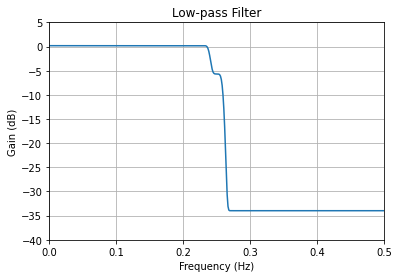

In [ ]:
w, H = signal.freqz(h, [1], worN=numtaps)
plot_response(fs, w, H, "Low-pass Filter")

Now, it's blatant that the Chebyshev’s alternance property is no longer respected.

## 3. Get both

In [ ]:
N = 400
nu_c = 0.49
v = signal.remez(N, [0,nu_c,0.5,.5],[1, 0])

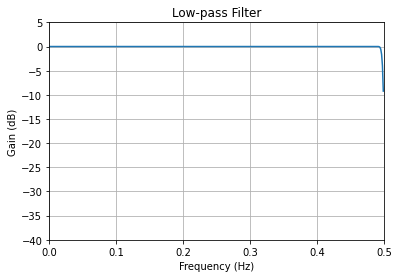

In [ ]:
w, V = signal.freqz(v, [1], worN=N)
plot_response(1, w, V, "Low-pass Filter")

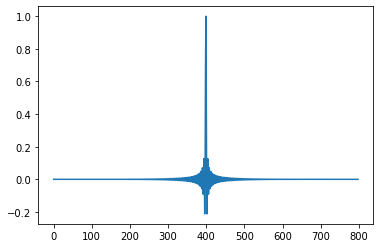

In [ ]:
c = 1
g = np.zeros(2*N-1)
g[::2] = c*v
g[N-1] = c
plt.plot(g)
plt.show()

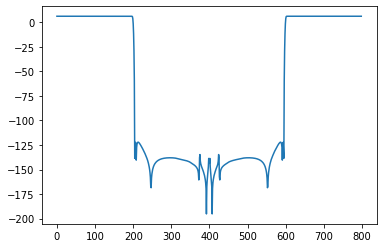

In [ ]:
G = np.fft.fft(g, n=2*N-1)
plt.plot(20*np.log10(np.abs(G)))
plt.savefig('/content/drive/MyDrive/Colab Notebooks/dataset-tp2-tsia/untitled.pdf')

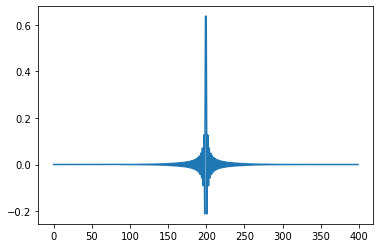

In [ ]:
plt.plot(v)
plt.show()

v is causal and symmetric

## 4. Raising and factorization of the half-band filter

The function is in part negative: True


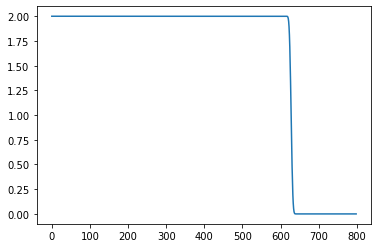

In [ ]:
def get_Gr(g):
  Gr = np.zeros(2*N-1)
  for k in range(2*N-1):
    nu = k / (2*N - 1)
    c = np.asarray([np.cos(2*i*nu) for i in range(N-1)])
    a = np.asarray([2*g[N-1-m] for m in range(N-1)])
    a[0] = g[N-1]
    Gr[k] = np.sum(np.real(a*c))
  return Gr

Gr = get_Gr(g)
print(f'The function is in part negative: {np.min(Gr)<0}')
plt.plot(Gr)
plt.show()

The function is negative, so we cannot factorize this. We need to up the function.

### 5. Creation of g+

The function is in part negative: False


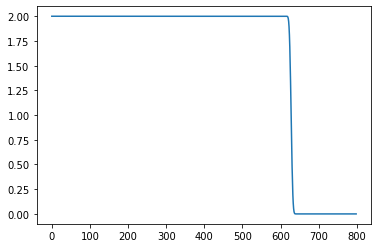

In [ ]:
def get_grp(Gr, g):
  eps = -np.min(Gr)
  gp = g
  gp[N-1] += eps
  return gp

gp = get_grp(Gr, g)
Grp = get_Gr(gp)
print(f'The function is in part negative: {np.min(Grp)<0}')
plt.plot(Grp)
plt.show()

It worked !

## 6. Factorization of Gp

In [ ]:
from scipy.optimize import fsolve
from scipy.linalg import hankel
def func(h):
  normh = np.sqrt(np.sum(h**2))
  h = (gp[N-1] / normh) * h # Normalisation of h
  H = hankel(np.zeros(N), h)
  return np.dot(H, np.transpose(h)) - np.transpose(gp[:N])

In [ ]:
hi = np.zeros(N)
hi[0] = 1
h0 = fsolve(func, hi)
normh = np.sqrt(np.sum(h0**2))
h0 = (gp[N-1] / normh) * h0

/usr/local/lib/python3.7/dist-packages/scipy/optimize/minpack.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)


In [ ]:
htilde = -np.conjugate(np.copy(h0[::-1]))

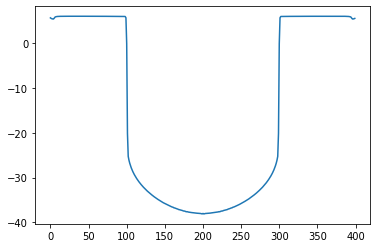

In [ ]:
H0 = np.fft.fft(h0, n=N)
Htilde = np.fft.fft(htilde, n=N)
Grp = H0 * Htilde
plt.plot(20*np.log10(np.abs(Grp)))
plt.show()

## 7. Implementation of the CQF filter bank

In the time domain, we can express $h_{1}$, $f_{0}$ and $f_{1}$ with the conjugate of $h_{0}$:
$$h_{1}(n) = -(-1)^{n}h_{0}^*(N-1-n)$$
$$f_{0}(n) = h_{0}^*(N-1-n)$$
$$f_{1}(n) = -(-1)^{n}h_{0}^*(n)$$

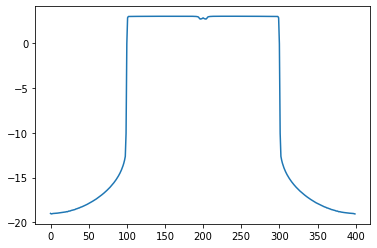

In [ ]:
hinv = np.copy(h0[::-1])
h1 = np.copy(hinv)
h1[::2] = - hinv[::2]
h1 = np.conjugate(h1)
H1 = np.fft.fft(h1, n=N)
plt.plot(20*np.log10(np.abs(H1)))
plt.show()

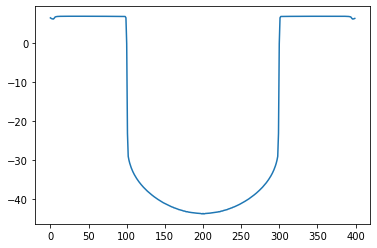

In [ ]:
f0 = np.conjugate(np.copy(hinv))
F0 = np.fft.fft(f0, n=N)
plt.plot(20*np.log(np.abs(F0)))
plt.show()

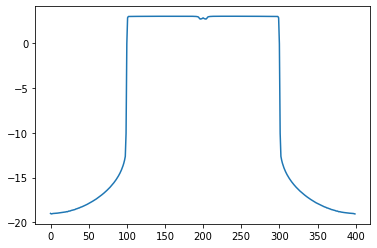

In [ ]:
f1 = np.copy(h0)
f1[::2] = - h0[::2]
f1 = np.conjugate(f1)
F1 = np.fft.fft(f1, n=N)
plt.plot(20*np.log10(np.abs(F1)))
plt.show()

In [ ]:
def CQF_filter(x):
  # x is the entry signal
  output = np.zeros(len(x))
  pas = N
  k = 0
  while k*pas < len(x):
    if ((k+1)*pas < len(x)):
      X  = np.fft.fft(x[k*pas:(k+1)*pas], n=N)
      T = 1/2 * (H0*F0 + H1*F1)
      Y = T*X
      y = np.fft.ifft(Y)
      output[k*pas:(k+1)*pas] = np.real(y)
    else:
      X  = np.fft.fft(x[k*pas:], n=N)
      T = 1/2 * (H0*F0 + H1*F1)
      Y = T*X
      y = np.fft.ifft(Y)
      output[k*pas:] = np.real(y[:len(x)-k*pas])
    k += 1
  return output

## 8. Test on the provided signals

#### On the 'homme3.wav'

The original signal

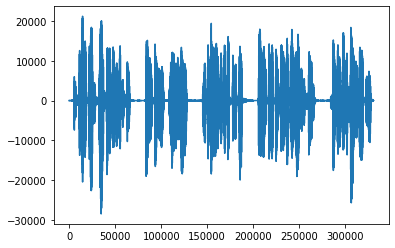

In [ ]:
plt.plot(x)
plt.show()

In [ ]:
Audio(x, rate=20000)

The reconstruction

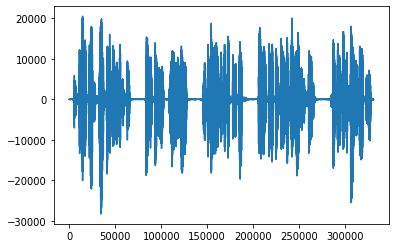

In [ ]:
y = CQF_filter(x)
plt.plot(y)
plt.show()

In [ ]:
Audio(y, rate=20000)

We hear residual noise due to the limited DFTD (not infinite), but we perceive well 

#### On the 'femme3.wav'

The original signal

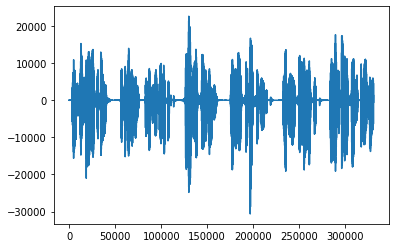

In [ ]:
plt.plot(x2)
plt.show()

In [ ]:
Audio(x2, rate=20000)

The reconstruction

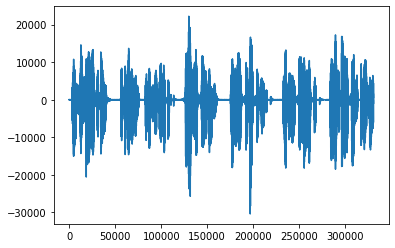

In [ ]:
y2 = CQF_filter(x2)
plt.plot(y2)
plt.show()

In [ ]:
Audio(y2, rate=20000)

Same remarks

# Transmultiplexer

## 1. Implementation with $C(z)=z^{-1}$

In [ ]:
s0 = np.copy(x)
s1 = np.copy(x2)
# We  verified that s0 and s1 have the same shape (the one of x, so the filter we created still works)

In [ ]:
def getX(s0, s1, c):
  X = np.zeros(2*len(s0), dtype=complex)
  pas = N//2
  k = 0
  C = np.fft.fft(c, n=len(c))
  while k*pas < len(s0):
    if ((k+1)*pas < len(s0)):
      frames0 = s0[k*pas:(k+1)*pas]
      frames1 = s1[k*pas:(k+1)*pas]
      if (2*len(frames0) != N):
        print('pb')
      s0tild = np.zeros(N)
      s0tild[::2] = frames0
      S0tild = np.fft.fft(s0tild, n=N)
      s1tild = np.zeros(N)
      s1tild[::2] = frames1
      S1tild = np.fft.fft(s1tild, n=N)
      SUM = S0tild*F0 + S1tild*F1
      X[2*k*pas:2*(k+1)*pas] = C*SUM
    else:
      frames0 = s0[k*pas:]
      frames1 = s1[k*pas:]
      s0tild = np.zeros(2*len(frames0))
      s0tild[::2] = frames0
      S0tild = np.fft.fft(s0tild, n=N)
      s1tild = np.zeros(2*len(frames1))
      s1tild[::2] = frames1
      S1tild = np.fft.fft(s1tild, n=N)
      SUM = S0tild*F0 + S1tild*F1
      X[2*k*pas:] = (C*SUM)[:len(X[2*k*pas:])]
    k += 1
  return X

In [ ]:
c = np.zeros(N)
c[1] = 1
X = getX(s0, s1, c)
x = np.real(np.fft.ifft(X))

In [ ]:
Audio(x, rate=20000)

We only hear noise.

In [ ]:
def transmultiplexer_ending(X):
  k = 0
  pas = N
  s0 = np.zeros(len(X)//2)
  s1 = np.zeros(len(X)//2)
  while k*pas < len(X):
    if ((k+1)*pas < len(X)):
      frameX = X[k*pas: (k+1)*pas]
      S0hat = frameX*H0
      S1hat = frameX*H1
      s0[(k*pas)//2: ((k+1)*pas)//2] = np.real(np.fft.ifft(S0hat))[::2]
      s1[(k*pas)//2: ((k+1)*pas)//2] = np.real(np.fft.ifft(S1hat))[::2]
    else:
      frameX = np.zeros(pas, dtype=complex)
      frameX[:len(X)-k*pas] = X[k*pas:]
      S0hat = frameX*H0
      S1hat = frameX*H1
      s0[k*pas//2:] = np.real(np.fft.ifft(S0hat))[:len(x)-k*pas:2]
      s1[k*pas//2:] = np.real(np.fft.ifft(S1hat))[:len(x)-k*pas:2]
    k += 1
  return s0, s1

In [ ]:
s0_0, s1_0 = transmultiplexer_ending(X)

In [ ]:
Audio(s0_0, rate=20000)

The reconstruction is perfect!

In [ ]:
Audio(s1_0, rate=20000)

Same !

## 2. Implementation for $C(z)$ not constant

### a. α=0.9

We want $C(z)D(z)=dz^{-n_0}$ where $n_0$ is an odd number and $C(z)=1-αz^{-1}$ and $|α|<1$ \\
So we want: $$D(z)=\frac{dz^{-n_0}}{C(Z)}=\frac{dz^{-n_0}}{1-\alpha z^{-1}}=dz^{-n_0}\sum_{k≥0}α^k z^{-k}=\sum_{k≥n_0}dα^{k-n_0} z^{-k}$$
So we chose $d_k=dα^{k-n_0}$ for $k≥n_0$ and 0 somewhere else.

In [ ]:
d0 = 1
n0 = 3
alpha1 = 0.9
d1 = np.zeros(N)
for k in range(n0, N):
  d1[k] = d0*(alpha1**(k-n0))
D1 = np.fft.fft(d1, n=N)

In [ ]:
c1 = np.zeros(N)
c1[0] = 1
c1[1] = -alpha1
X1 = getX(s0, s1, c1)
x1 = np.real(np.fft.ifft(X1))

In [ ]:
Xtild1 = np.copy(X1)
pas = N
k = 0
while k*pas < len(X):
  if ((k+1)*pas < len(X)):
    Xtild1[k*pas: (k+1)*pas] = X1[k*pas: (k+1)*pas] * D1
  else:
    Xtild1[k*pas:] = X1[k*pas:] * D1[:len(X1) - k*pas]
  k+=1
s0_1, s1_1 = transmultiplexer_ending(Xtild1)

In [ ]:
Audio(s0_1, rate=20000)

In [ ]:
Audio(s1_1, rate=20000)

The reconstructions are more degraded than before.

### b. $α=1.2$

If $α=1.2$ then the filter D is unstable. Moreover, we cannot use the stable implementation because it's also anti-causal and infinite. \\
The solution is to truncate the anti-causal filter and then translating it over time to make it causal.\
We have:
$$D(z)=\frac{dz^{-n_0}}{1-\alpha z^{-1}}=-α^{-1}z\frac{dz^{-n_0}}{1-α^{-1} z^{-1}}= -α^{-1}dz^{1-n_0}\sum_{k≥0}α^{-k} z^{k}=\sum_{k≤n_0-1}-α^{k-n_0}d z^{-k}$$

In [ ]:
alpha2 = 1.2
d2 = np.zeros(N)
for k in range(n0-1, N):
  d2[k] = -d0*(alpha1**(-k-n0))
d2 = d2[::-1]
D2 = np.fft.fft(d2, n=N)

In [ ]:
c2 = np.zeros(N)
c2[0] = 1
c2[1] = -alpha2
X2 = getX(s0, s1, c2)
x2 = np.real(np.fft.ifft(X2))

In [ ]:
Xtild2 = np.copy(X2)
pas = N
k = 0
while k*pas < len(X2):
  if ((k+1)*pas < len(X2)):
    Xtild2[k*pas: (k+1)*pas] = X2[k*pas: (k+1)*pas] * D2
  else:
    Xtild2[k*pas:] = X2[k*pas:] * D2[:len(X2) - k*pas]
  k+=1

s0_2, s1_2 = transmultiplexer_ending(Xtild2)

In [ ]:
Audio(s0_2, rate=20000)

In [ ]:
Audio(s1_2, rate=20000)

We struggle to separate the 2 audios (We can hear one better than the other one).

## 3. Case where $C(z)$ is unknown